In [76]:
import pandas as pd

In [54]:
import numpy as np

In [84]:
pip install gdown

  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
Using cached tqdm-4.67.1-py3-none-any.whl (78 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [gdown]
Note: you may need to restart the kernel to use updated packages.


In [85]:
import gdown

In [87]:
# Загрузка данных в датафрэйм
gdown.download('https://drive.google.com/uc?id=1eUWO6tAac-u-a1IrIqXJWgKE_4JJyjWt', 'data.csv', quiet=False)
data = pd.read_csv('data.csv')

Downloading...
From (original): https://drive.google.com/uc?id=1eUWO6tAac-u-a1IrIqXJWgKE_4JJyjWt
From (redirected): https://drive.google.com/uc?id=1eUWO6tAac-u-a1IrIqXJWgKE_4JJyjWt&confirm=t&uuid=28b798ab-b143-48b6-be78-1a8659565478
To: /Users/wyrtnh.w/DataEngineeringITMO2025/data.csv
100%|██████████| 501M/501M [00:30<00:00, 16.3MB/s] 
/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/2983637406.py:3: DtypeWarning: Columns (0,30) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('data.csv')


In [88]:
data.head(10)

,seqname,source,feature,start,end,score,strand,frame,CCDS,basic,...,mRNA_start_NF,protein_id,protein_version,seleno,transcript_biotype,transcript_id,transcript_name,transcript_source,transcript_support_level,transcript_version
0,1,havana,gene,11869,14409,.,+,.,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,havana,transcript,11869,14409,.,+,.,NaN,1.0,...,NaN,NaN,NaN,NaN,processed_transcript,ENST00000456328,DDX11L1-202,havana,1,2.0
2,1,havana,exon,11869,12227,.,+,.,NaN,1.0,...,NaN,NaN,NaN,NaN,processed_transcript,ENST00000456328,DDX11L1-202,havana,1,2.0
3,1,havana,exon,12613,12721,.,+,.,NaN,1.0,...,NaN,NaN,NaN,NaN,processed_transcript,ENST00000456328,DDX11L1-202,havana,1,2.0
4,1,havana,exon,13221,14409,.,+,.,NaN,1.0,...,NaN,NaN,NaN,NaN,processed_transcript,ENST00000456328,DDX11L1-202,havana,1,2.0
5,1,havana,transcript,12010,13670,.,+,.,NaN,1.0,...,NaN,NaN,NaN,NaN,transcribed_unprocessed_pseudogene,ENST00000450305,DDX11L1-201,havana,NaN,2.0
6,1,havana,exon,12010,12057,.,+,.,NaN,1.0,...,NaN,NaN,NaN,NaN,transcribed_unprocessed_pseudogene,ENST00000450305,DDX11L1-201,havana,NaN,2.0
7,1,havana,exon,12179,12227,.,+,.,NaN,1.0,...,NaN,NaN,NaN,NaN,transcribed_unprocessed_pseudogene,ENST00000450305,DDX11L1-201,havana,NaN,2.0
8,1,havana,exon,12613,12697,.,+,.,NaN,1.0,...,NaN,NaN,NaN,NaN,transcribed_unprocessed_pseudogene,ENST00000450305,DDX11L1-201,havana,NaN,2.0
9,1,havana,exon,12975,13052,.,+,.,NaN,1.0,...,NaN,NaN,NaN,NaN,transcribed_unprocessed_pseudogene,ENST00000450305,DDX11L1-201,havana,NaN,2.0


# **Очистка данных**

In [91]:
# Выводим количество пропущенных значений в датасете
data.isnull().sum()

seqname                           0
source                            0
feature                           0
start                             0
end                               0
score                             0
strand                            0
frame                             0
CCDS                        1583406
basic                       1066773
ccds_id                     1583406
cds_end_NF                  2422869
cds_start_NF                2497466
exon_id                     1452263
exon_number                  554721
exon_version                1452263
gene_biotype                      0
gene_id                           0
gene_name                         0
gene_source                       0
gene_version                      0
mRNA_end_NF                 2406518
mRNA_start_NF               2489901
protein_id                  1954917
protein_version             1954917
seleno                      2687953
transcript_biotype            58395
transcript_id               

In [92]:
# Выводим количество пропущенных значений в процентах
missing_data = (data.isnull().sum() / len(data)) * 100
missing_data

seqname                      0.000000
source                       0.000000
feature                      0.000000
start                        0.000000
end                          0.000000
score                        0.000000
strand                       0.000000
frame                        0.000000
CCDS                        58.872175
basic                       39.663388
ccds_id                     58.872175
cds_end_NF                  90.084014
cds_start_NF                92.857584
exon_id                     53.996184
exon_number                 20.624926
exon_version                53.996184
gene_biotype                 0.000000
gene_id                      0.000000
gene_name                    0.000000
gene_source                  0.000000
gene_version                 0.000000
mRNA_end_NF                 89.476072
mRNA_start_NF               92.576312
protein_id                  72.685221
protein_version             72.685221
seleno                      99.940027
transcript_b

Есть признаки, у которых пропуски > 50 %, поэтому удалем их

In [93]:
# Удаляем столбцы, где пропусков больше 50%
data = data.loc[:, data.isnull().mean() <= 0.5]

In [94]:
missing_data = (data.isnull().sum() / len(data)) * 100
missing_data

seqname                      0.000000
source                       0.000000
feature                      0.000000
start                        0.000000
end                          0.000000
score                        0.000000
strand                       0.000000
frame                        0.000000
basic                       39.663388
exon_number                 20.624926
gene_biotype                 0.000000
gene_id                      0.000000
gene_name                    0.000000
gene_source                  0.000000
gene_version                 0.000000
transcript_biotype           2.171168
transcript_id                2.171168
transcript_name              2.171168
transcript_source            2.171168
transcript_support_level     8.404590
transcript_version           2.171168
dtype: float64

In [95]:
data

,seqname,source,feature,start,end,score,strand,frame,basic,exon_number,...,gene_id,gene_name,gene_source,gene_version,transcript_biotype,transcript_id,transcript_name,transcript_source,transcript_support_level,transcript_version
0,1,havana,gene,11869,14409,.,+,.,NaN,NaN,...,ENSG00000223972,DDX11L1,havana,5,NaN,NaN,NaN,NaN,NaN,NaN
1,1,havana,transcript,11869,14409,.,+,.,1.0,NaN,...,ENSG00000223972,DDX11L1,havana,5,processed_transcript,ENST00000456328,DDX11L1-202,havana,1,2.0
2,1,havana,exon,11869,12227,.,+,.,1.0,1.0,...,ENSG00000223972,DDX11L1,havana,5,processed_transcript,ENST00000456328,DDX11L1-202,havana,1,2.0
3,1,havana,exon,12613,12721,.,+,.,1.0,2.0,...,ENSG00000223972,DDX11L1,havana,5,processed_transcript,ENST00000456328,DDX11L1-202,havana,1,2.0
4,1,havana,exon,13221,14409,.,+,.,1.0,3.0,...,ENSG00000223972,DDX11L1,havana,5,processed_transcript,ENST00000456328,DDX11L1-202,havana,1,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2689561,KI270713.1,ensembl,transcript,35407,35916,.,+,.,1.0,NaN,...,ENSG00000268674,FAM231C,ensembl,2,protein_coding,ENST00000601199,FAM231C-201,ensembl,NaN,2.0
2689562,KI270713.1,ensembl,exon,35407,35916,.,+,.,1.0,1.0,...,ENSG00000268674,FAM231C,ensembl,2,protein_coding,ENST00000601199,FAM231C-201,ensembl,NaN,2.0
2689563,KI270713.1,ensembl,CDS,35407,35913,.,+,0,1.0,1.0,...,ENSG00000268674,FAM231C,ensembl,2,protein_coding,ENST00000601199,FAM231C-201,ensembl,NaN,2.0
2689564,KI270713.1,ensembl,start_codon,35407,35409,.,+,0,1.0,1.0,...,ENSG00000268674,FAM231C,ensembl,2,protein_coding,ENST00000601199,FAM231C-201,ensembl,NaN,2.0


In [96]:
# Копируем датасет для проведения манипуляций над данными в нем
df = data.copy()

# **Приведение типов**

In [98]:
# Выводим типы данных
df.dtypes

seqname                      object
source                       object
feature                      object
start                         int64
end                           int64
score                        object
strand                       object
frame                        object
basic                       float64
exon_number                 float64
gene_biotype                 object
gene_id                      object
gene_name                    object
gene_source                  object
gene_version                  int64
transcript_biotype           object
transcript_id                object
transcript_name              object
transcript_source            object
transcript_support_level     object
transcript_version          float64
dtype: object

In [99]:
# Числовые колонки
df['basic'] = df['basic'].fillna(-1).astype(int)
df['exon_number'] = df['exon_number'].fillna(-1).astype(int)
df['transcript_version'] = df['transcript_version'].fillna(-1).astype(int)

# Все текстовые колонки делаем строками
text_cols = ['seqname', 'source', 'feature', 'score', 'strand', 'frame', 
             'gene_biotype', 'transcript_biotype', 'transcript_support_level',
             'gene_id', 'gene_name', 'gene_source', 'transcript_id', 
             'transcript_name', 'transcript_source']

for col in text_cols:
    df[col] = df[col].fillna('unknown').astype(str)

# Проверяем типы
df.dtypes

seqname                     object
source                      object
feature                     object
start                        int64
end                          int64
score                       object
strand                      object
frame                       object
basic                        int64
exon_number                  int64
gene_biotype                object
gene_id                     object
gene_name                   object
gene_source                 object
gene_version                 int64
transcript_biotype          object
transcript_id               object
transcript_name             object
transcript_source           object
transcript_support_level    object
transcript_version           int64
dtype: object

In [101]:
pip install parquet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 837.0/837.0 kB 2.4 MB/s  0:00:00 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [parquet]m2/3 [parquet]
Note: you may need to restart the kernel to use updated packages.


In [102]:
df.to_parquet('df_genomic.parquet', index=False)

# **Метрики качества данных**

### **1. Completeness – полнота данных**

In [103]:
completeness = (1 - df.isnull().mean()).round(4)
print("Completeness (полнота данных):")
print(completeness)

Completeness (полнота данных):
seqname                     1.0
source                      1.0
feature                     1.0
start                       1.0
end                         1.0
score                       1.0
strand                      1.0
frame                       1.0
basic                       1.0
exon_number                 1.0
gene_biotype                1.0
gene_id                     1.0
gene_name                   1.0
gene_source                 1.0
gene_version                1.0
transcript_biotype          1.0
transcript_id               1.0
transcript_name             1.0
transcript_source           1.0
transcript_support_level    1.0
transcript_version          1.0
dtype: float64


Нет пропущенных значений (все данные заполнены)

### **2. Uniqueness – уникальность записей**

In [104]:
# Проверяем ключевые идентификаторы
key_columns = ['gene_id', 'transcript_id', 'gene_name']
uniqueness = {}

for col in key_columns:
    if col in df.columns:
        total = len(df[col])
        unique = df[col].nunique()
        uniqueness[col] = round(unique / total, 4)

print("Uniqueness (уникальность):")
for col, score in uniqueness.items():
    print(f"{col}: {score}")

Uniqueness (уникальность):
gene_id: 0.0217
transcript_id: 0.0758
gene_name: 0.0211


Низкая уникальность идентификаторов (это нормально для геномных данных – один ген может иметь много транскриптов)

### **3.  Duplication Rate – уровень дубликатов**

In [106]:
# Дубликаты по всем колонкам
total_rows = len(df)
duplicate_rows = df.duplicated().sum()
duplication_rate = round(duplicate_rows / total_rows, 4)

print(f"Duplication Rate (уровень дубликатов): {duplication_rate}")
print(f"Дубликатов: {duplicate_rows} из {total_rows} строк")

# Дубликаты по ключевым колонкам
if 'gene_id' in df.columns:
    gene_duplicates = df['gene_id'].duplicated().sum()
    gene_duplication_rate = round(gene_duplicates / total_rows, 4)
    print(f"Duplication Rate по gene_id: {gene_duplication_rate}")

Duplication Rate (уровень дубликатов): 0.0
Дубликатов: 0 из 2689566 строк
Duplication Rate по gene_id: 0.9783


По gene_id: {gene_duplication_rate} - 97.83% дубликатов ID (это нормально – гены повторяются в разных записях (экзоны, транскрипты))

### **4. Outlier Ratio - доля выбросов**

In [107]:
# Для числовых колонок
numeric_cols = ['start', 'end', 'basic', 'exon_number', 'transcript_version']
outlier_ratio = {}

for col in numeric_cols:
    if col in df.columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        outliers = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()
        outlier_ratio[col] = round(outliers / len(df), 4)

print("Outlier Ratio (доля выбросов):")
for col, ratio in outlier_ratio.items():
    print(f"{col}: {ratio}")

Outlier Ratio (доля выбросов):
start: 0.015
end: 0.015
basic: 0.0
exon_number: 0.0718
transcript_version: 0.001


Приемлемый уровень выбросов

**Визуализация**

In [108]:
import matplotlib.pyplot as plt

start: 40216 выбросов
end: 40216 выбросов
exon_number: 193073 выбросов


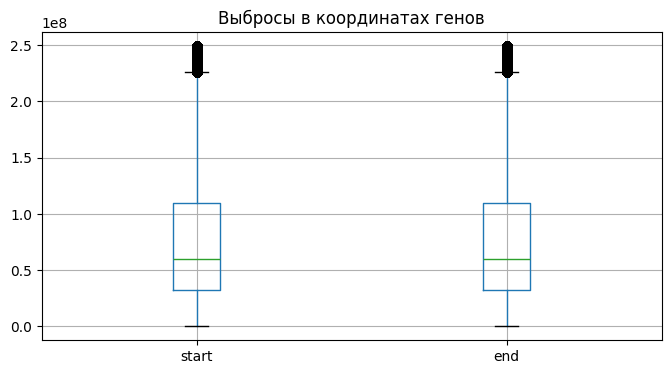

In [109]:
# Прроверка выбросов
for col in ['start', 'end', 'exon_number']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    outliers = ((df[col] < Q1 - 1.5*(Q3-Q1)) | (df[col] > Q3 + 1.5*(Q3-Q1))).sum()
    print(f"{col}: {outliers} выбросов")

# Простой boxplot
plt.figure(figsize=(8, 4))
df[['start', 'end']].boxplot()
plt.title("Выбросы в координатах генов")
plt.show()

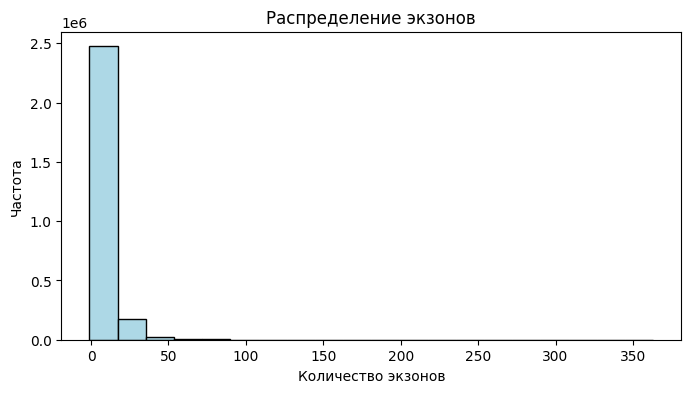

In [110]:
# Гистограмма количества экзонов
plt.figure(figsize=(8, 4))
plt.hist(df['exon_number'], bins=20, color='lightblue', edgecolor='black')
plt.title("Распределение экзонов")
plt.xlabel("Количество экзонов")
plt.ylabel("Частота")
plt.show()

### **5. Семантический анализ**

In [111]:
# Типы генов
print("Топ 10 типов генов:")
print(df['gene_biotype'].value_counts().head(10))

# Типы транскриптов
print("\nТоп 10 типов транскриптов:")
print(df['transcript_biotype'].value_counts().head(10))

# Особенности генов
print(f"\nОбзор генов:")
print(f"Всего уникальных генов: {df['gene_id'].nunique()}")
print(f"Всего уникальных имен генов: {df['gene_name'].nunique()}")

Топ 10 типов генов:
gene_biotype
protein_coding                        2457398
lincRNA                                 58519
antisense                               45385
processed_pseudogene                    32270
transcribed_unprocessed_pseudogene      18075
processed_transcript                    17540
unprocessed_pseudogene                  13539
misc_RNA                                 6663
snRNA                                    5727
miRNA                                    5637
Name: count, dtype: int64

Топ 10 типов транскриптов:
transcript_biotype
protein_coding                        1823877
nonsense_mediated_decay                332122
processed_transcript                   154591
retained_intron                        148122
unknown                                 58395
lincRNA                                 56392
antisense                               45662
processed_pseudogene                    22056
unprocessed_pseudogene                  10877
transcribed_unproces

– Доминируют protein_coding гены – 90% записей относятся к белково-кодирующим генам

– Разнообразие биологических функций – преобладают protein_coding транскрипты, но есть много регуляторных типов

– 58K уникальных генов - база содержит аннотации для 58 тысяч генов с почти уникальными именами

### **6. Корреляции**

In [112]:
# Простые корреляции между числовыми признаками
numeric_cols = ['start', 'end', 'basic', 'exon_number', 'transcript_version']
numeric_df = df[numeric_cols]

print("Корреляции:")
print(numeric_df.corr().round(3))

# Самая сильная корреляция
corr_matrix = numeric_df.corr()
strong_corr = corr_matrix.unstack().sort_values(ascending=False)
strong_corr = strong_corr[strong_corr < 0.99]  # убираем корреляцию с собой
print(f"\nСамая сильная корреляция: {strong_corr.index[0]} = {strong_corr.iloc[0]:.3f}")

Корреляции:
                    start    end  basic  exon_number  transcript_version
start               1.000  1.000  0.016        0.060               0.007
end                 1.000  1.000  0.016        0.060               0.007
basic               0.016  0.016  1.000        0.214               0.354
exon_number         0.060  0.060  0.214        1.000               0.211
transcript_version  0.007  0.007  0.354        0.211               1.000

Самая сильная корреляция: ('transcript_version', 'basic') = 0.354


Сильная связь start-end – координаты генов идеально коррелируют

### **7. Фичеинжиниринг (базовые фичи)**

In [113]:
# Длина гена/транскрипта
df['gene_length'] = df['end'] - df['start']
print(f"Средняя длина гена: {df['gene_length'].mean():.0f} пар оснований")

# Количество экзонов на транскрипт
if 'exon_number' in df.columns:
    exon_stats = df.groupby('transcript_id')['exon_number'].max().describe()
    print(f"\nСтатистика экзонов на транскрипт:")
    print(f"Мин: {exon_stats['min']}, Макс: {exon_stats['max']}, Среднее: {exon_stats['mean']:.1f}")

# Признак "длинный ген"
df['is_long_gene'] = (df['gene_length'] > df['gene_length'].median()).astype(int)
print(f"\nДлинные гены (> медианы): {df['is_long_gene'].mean():.1%}")

Средняя длина гена: 3558 пар оснований

Статистика экзонов на транскрипт:
Мин: -1.0, Макс: 363.0, Среднее: 6.1

Длинные гены (> медианы): 49.7%


Средний ген 3.5K пар оснований – с равным распределением на короткие и длинные гены

### **8. Обзор источников данных**

In [114]:
# Источники генов
print("Источники аннотаций генов:")
print(df['source'].value_counts())

# Уровень поддержки транскриптов
print("\nУровень поддержки транскриптов:")
print(df['transcript_support_level'].value_counts())

Источники аннотаций генов:
source
havana            1752993
ensembl_havana     685143
ensembl            245756
mirbase              5637
insdc                  37
Name: count, dtype: int64

Уровень поддержки транскриптов:
transcript_support_level
1                                      928367
5                                      615090
2                                      461215
3                                      249724
unknown                                226047
                                        ...  
3 (assigned to previous version 8)         48
4 (assigned to previous version 4)         46
2 (assigned to previous version 11)        44
3 (assigned to previous version 4)         38
3 (assigned to previous version 9)         23
Name: count, Length: 66, dtype: int64


Havana-Ensembl коллаборация – данные в основном от двух ведущих консорциумов аннотаций

# **Создание новых признаков**

### **Анализ геномных координат и создание производных признаков**
Геномные координаты (start и end) – это признаки, которые определяют позицию генетических элементов в геноме. На их основе можно создать множество полезных производных признаков для анализа структуры и организации генома.

### **Основные идеи для создания признаков:**
– длина генетических элементов – показывает размер гена/транскрипта/экзона

– плотность генов – как близко расположены гены друг к другу

– особенности хромосом – распределение генов по разным хромосомам

– структурные паттерны – закономерности в организации генома

In [136]:
# 1. Базовая длина геномного элемента
df['gene_length'] = df['end'] - df['start']
print(f"Средняя длина гена: {df['gene_length'].mean():.0f} пар оснований")

# 2. Категоризация по размеру
df['size_category'] = pd.cut(df['gene_length'], 
                            bins=[0, 1000, 5000, 10000, float('inf')],
                            labels=['very_short', 'short', 'medium', 'long'])

# 3. Позиция относительно начала хромосомы
chromosome_lengths = df.groupby('seqname')['end'].max()
df['relative_position'] = df['start'] / df['seqname'].map(chromosome_lengths)

print("Распределение по размерным категориям:")
print(df['size_category'].value_counts())

Средняя длина гена: 3558 пар оснований
Распределение по размерным категориям:
size_category
very_short    2395756
short          130706
long           123096
medium          37502
Name: count, dtype: int64


Подавляющее большинство генов в геноме человека являются очень короткими. Около 89% всех генов имеют длину менее 1000 пар оснований, что составляет 2 395 756 генов из общего количества 2 689 566. Такое преобладание коротких генетических последовательностей свидетельствует о том, что основная часть генома занята регуляторными элементами, которые управляют активностью других генов, а не кодируют белки непосредственно.

Стандартные белок-кодирующие гены, отвечающие за синтез функциональных белков, составляют лишь 5% от общего числа генов. Это 130 706 генов длиной от 1 до 5 тысяч пар оснований, которые выполняют основные структурные и функциональные задачи в клетке. Еще более редкими являются длинные гены – их всего 4,5% (123 096 генов), причем такие гены обычно отличаются сложной организацией и содержат множество экзонов.

Соотношение коротких и длинных генов составляет примерно 20:1, что наглядно демонстрирует фундаментальный принцип организации генома человека: система управления генной активностью значительно превосходит по объему саму систему кодирования белков. Это подчеркивает исключительную сложность регуляторных механизмов, обеспечивающих точное включение и выключение генов в нужное время и в нужных типах клеток.

### **Длина геномного элемента**

In [143]:
# Длина от start до end
df['gene_length'] = df['end'] - df['start']

### **Категория размера гена**

In [144]:
# Разбиваем гены на 3 категории по длине
df['size_category'] = 'medium'
df.loc[df['gene_length'] < 1000, 'size_category'] = 'short'
df.loc[df['gene_length'] > 10000, 'size_category'] = 'long'

### **Бинарные признаки для биотипов**

In [145]:
# Самые частые типы генов
df['is_protein_coding'] = (df['gene_biotype'] == 'protein_coding').astype(int)
df['is_pseudogene'] = df['gene_biotype'].str.contains('pseudogene', na=False).astype(int)

### **Признаки качества данных**

In [146]:
# Заполняем пропуски в числовых колонках
df['basic_filled'] = df['basic'].fillna(0)
df['exon_number_filled'] = df['exon_number'].fillna(0)

In [141]:
# Смотрим какие признаки добавились
new_columns = [col for col in df.columns if col not in ['gene_length', 'size_category', 'is_protein_coding', 
                                                       'is_pseudogene', 'basic_filled', 'exon_number_filled']]
print(f"Всего признаков: {len(df.columns)}")
print(f"Новые признаки: {[col for col in df.columns if col not in new_columns]}")

Всего признаков: 29
Новые признаки: ['gene_length', 'size_category', 'is_protein_coding', 'is_pseudogene', 'basic_filled', 'exon_number_filled']


In [147]:
df

,seqname,source,feature,start,end,score,strand,frame,basic,exon_number,...,transcript_support_level,transcript_version,gene_length,is_long_gene,size_category,relative_position,is_protein_coding,is_pseudogene,basic_filled,exon_number_filled
0,1,havana,gene,11869,14409,.,+,.,-1,-1,...,unknown,-1,2540,1,medium,0.000048,0,1,-1,-1
1,1,havana,transcript,11869,14409,.,+,.,1,-1,...,1,2,2540,1,medium,0.000048,0,1,1,-1
2,1,havana,exon,11869,12227,.,+,.,1,1,...,1,2,358,1,short,0.000048,0,1,1,1
3,1,havana,exon,12613,12721,.,+,.,1,2,...,1,2,108,0,short,0.000051,0,1,1,2
4,1,havana,exon,13221,14409,.,+,.,1,3,...,1,2,1188,1,medium,0.000053,0,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2689561,KI270713.1,ensembl,transcript,35407,35916,.,+,.,1,-1,...,unknown,2,509,1,short,0.985828,1,0,1,-1
2689562,KI270713.1,ensembl,exon,35407,35916,.,+,.,1,1,...,unknown,2,509,1,short,0.985828,1,0,1,1
2689563,KI270713.1,ensembl,CDS,35407,35913,.,+,0,1,1,...,unknown,2,506,1,short,0.985828,1,0,1,1
2689564,KI270713.1,ensembl,start_codon,35407,35409,.,+,0,1,1,...,unknown,2,2,0,short,0.985828,1,0,1,1


# **Визуализация данных**

In [155]:
pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Note: you may need to restart the kernel to use updated packages.


In [157]:
pip install plotly.express

  Using cached plotly-6.3.1-py3-none-any.whl.metadata (8.5 kB)
Using cached plotly-6.3.1-py3-none-any.whl (9.8 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.5/23.5 MB 6.6 MB/s  0:00:03m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 8.8 MB/s  0:00:01eta 0:00:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [plotly.express]m [plotly.express]
Note: you may need to restart the kernel to use updated packages.


In [158]:
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [159]:
# Устанавливаем единый стиль для всех графиков
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
custom_palette = ["#2E86AB", "#A23B72", "#F18F01", "#C73E1D", "#3B1C32"]
sns.set_palette(custom_palette)

# Устанавливаем размер шрифта
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14

### **1. Гистограммы**

/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/745732595.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_boxplot, x='size_category', y='gene_length', ax=axes[1,1], palette=custom_palette)
/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/745732595.py:31: UserWarning: The palette list has more values (5) than needed (3), which may not be intended.
  sns.boxplot(data=df_boxplot, x='size_category', y='gene_length', ax=axes[1,1], palette=custom_palette)


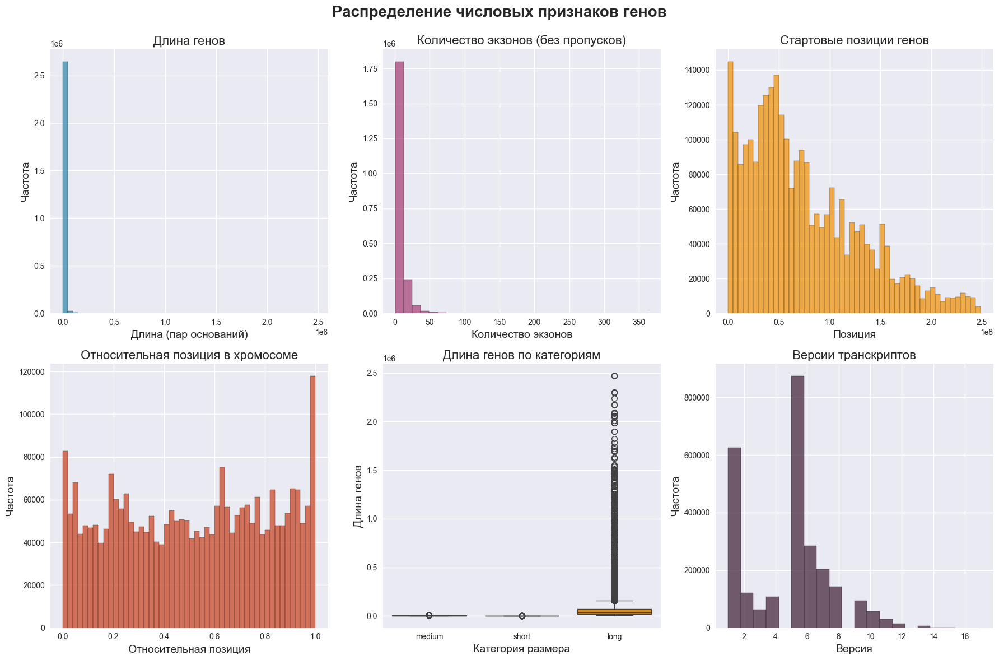

In [161]:
# Распределение числовых признаков
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Распределение числовых признаков генов', fontsize=20, fontweight='bold')

# Гистограмма длины генов
axes[0,0].hist(df['gene_length'], bins=50, color='#2E86AB', alpha=0.7, edgecolor='black')
axes[0,0].set_title('Длина генов')
axes[0,0].set_xlabel('Длина (пар оснований)')
axes[0,0].set_ylabel('Частота')

# Гистограмма количества экзонов
axes[0,1].hist(df[df['exon_number'] > 0]['exon_number'], bins=30, color='#A23B72', alpha=0.7, edgecolor='black')
axes[0,1].set_title('Количество экзонов (без пропусков)')
axes[0,1].set_xlabel('Количество экзонов')
axes[0,1].set_ylabel('Частота')

# Гистограмма стартовых позиций
axes[0,2].hist(df['start'], bins=50, color='#F18F01', alpha=0.7, edgecolor='black')
axes[0,2].set_title('Стартовые позиции генов')
axes[0,2].set_xlabel('Позиция')
axes[0,2].set_ylabel('Частота')

# Гистограмма относительной позиции
axes[1,0].hist(df['relative_position'], bins=50, color='#C73E1D', alpha=0.7, edgecolor='black')
axes[1,0].set_title('Относительная позиция в хромосоме')
axes[1,0].set_xlabel('Относительная позиция')
axes[1,0].set_ylabel('Частота')

# Boxplot длины генов по категориям размера
df_boxplot = df[df['size_category'].isin(['short', 'medium', 'long'])]
sns.boxplot(data=df_boxplot, x='size_category', y='gene_length', ax=axes[1,1], palette=custom_palette)
axes[1,1].set_title('Длина генов по категориям')
axes[1,1].set_xlabel('Категория размера')
axes[1,1].set_ylabel('Длина генов')

# Распределение версий транскриптов
axes[1,2].hist(df[df['transcript_version'] > 0]['transcript_version'], 
               bins=20, color='#3B1C32', alpha=0.7, edgecolor='black')
axes[1,2].set_title('Версии транскриптов')
axes[1,2].set_xlabel('Версия')
axes[1,2].set_ylabel('Частота')

plt.tight_layout()
plt.show()

### **2. Тепловая карта корреляций**

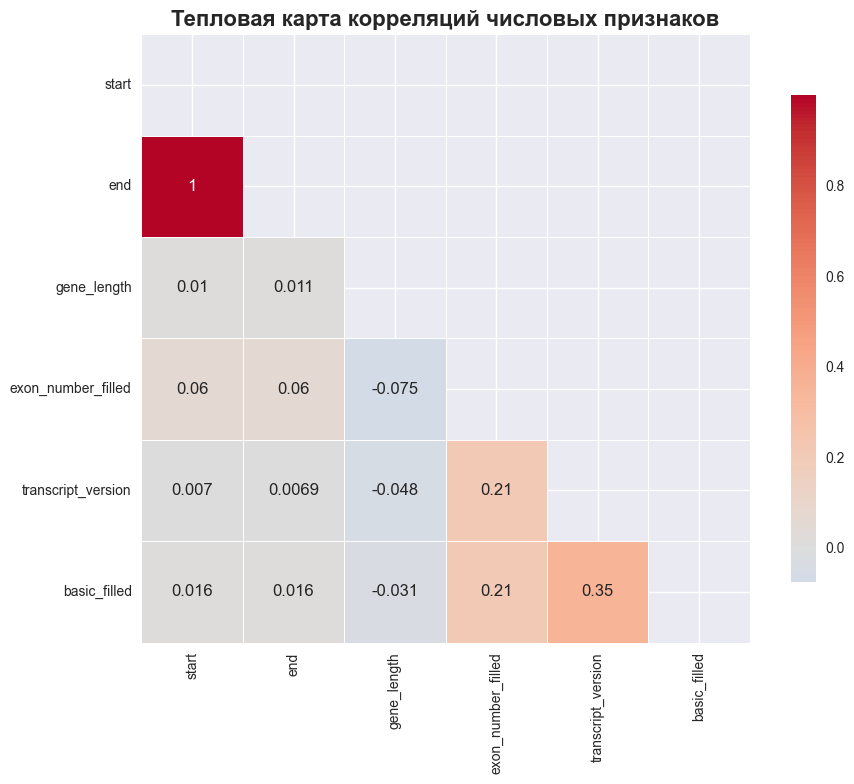

In [162]:
# Seaborn
plt.figure(figsize=(10, 8))
numeric_cols = ['start', 'end', 'gene_length', 'exon_number_filled', 'transcript_version', 'basic_filled']
correlation_matrix = df[numeric_cols].corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title('Тепловая карта корреляций числовых признаков', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### **3. Круговая диаграмма**

In [164]:
# Типы генов (Plotly)
top_gene_biotypes = df['gene_biotype'].value_counts().head(8)
fig = px.pie(values=top_gene_biotypes.values, 
             names=top_gene_biotypes.index,
             title='Распределение типов генов (Топ 8)',
             color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

### **4. Столбчатые диаграммы**

/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/4049845593.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/4049845593.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




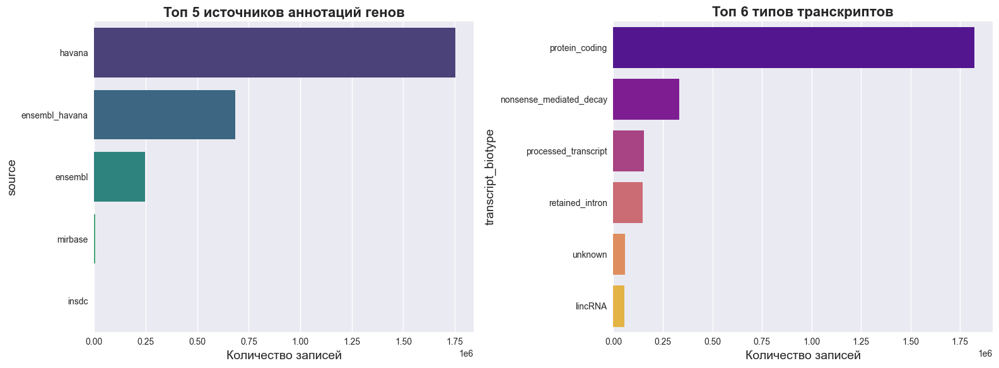

In [166]:
# Сравнение по источникам и типам
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Топ источников данных
top_sources = df['source'].value_counts().head(5)
sns.barplot(x=top_sources.values, y=top_sources.index, ax=axes[0], palette='viridis')
axes[0].set_title('Топ 5 источников аннотаций генов', fontweight='bold')
axes[0].set_xlabel('Количество записей')

# Топ типов транскриптов
top_transcript_types = df['transcript_biotype'].value_counts().head(6)
sns.barplot(x=top_transcript_types.values, y=top_transcript_types.index, ax=axes[1], palette='plasma')
axes[1].set_title('Топ 6 типов транскриптов', fontweight='bold')
axes[1].set_xlabel('Количество записей')

plt.tight_layout()
plt.show()

### **5. Scatter plot**

In [167]:
# Длина генов vs Количество экзонов (Plotly)
fig = px.scatter(df[df['exon_number_filled'] > 0].sample(1000, random_state=42),
                 x='gene_length', 
                 y='exon_number_filled',
                 color='size_category',
                 size='exon_number_filled',
                 hover_data=['gene_biotype'],
                 title='Зависимость длины гена от количества экзонов',
                 labels={'gene_length': 'Длина гена', 'exon_number_filled': 'Количество экзонов'},
                 color_discrete_sequence=px.colors.qualitative.Bold)
fig.update_layout(showlegend=True)
fig.show()

### **6. Violin plot**

/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/211103588.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/211103588.py:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




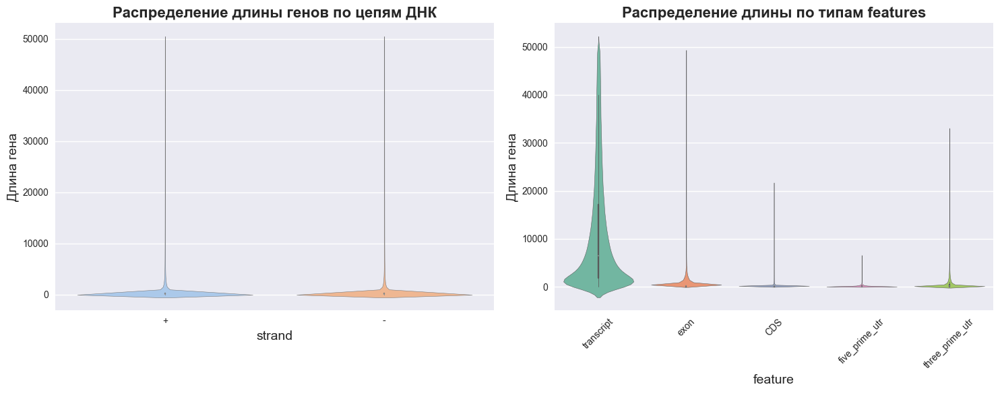

In [169]:
# Распределение по strand и feature
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Violin plot по strand
sns.violinplot(data=df[df['gene_length'] < 50000],  # ограничиваем для лучшей визуализации
               x='strand', y='gene_length', ax=axes[0], palette='pastel')
axes[0].set_title('Распределение длины генов по цепям ДНК', fontweight='bold')
axes[0].set_ylabel('Длина гена')

# Violin plot по feature (топ 5)
top_features = df['feature'].value_counts().head(5).index
feature_subset = df[df['feature'].isin(top_features)]
sns.violinplot(data=feature_subset[feature_subset['gene_length'] < 50000],
               x='feature', y='gene_length', ax=axes[1], palette='Set2')
axes[1].set_title('Распределение длины по типам features', fontweight='bold')
axes[1].set_ylabel('Длина гена')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### **7. Sunburst plot**

In [170]:
# Иерархия данных (Plotly)
# Создаем сэмпл данных для sunburst (из-за большого объема)
sunburst_sample = df[df['gene_biotype'].isin(['protein_coding', 'lincRNA', 'antisense'])].sample(2000, random_state=42)

fig = px.sunburst(sunburst_sample,
                  path=['source', 'gene_biotype', 'feature'],
                  title='Иерархия геномных данных: Источник → Тип гена → Feature',
                  color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_layout(margin=dict(t=50, l=0, r=0, b=0))
fig.show()

### **8. Count plot**

/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/1686419036.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/1686419036.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/1686419036.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/jb/lq1vf3td1vnb6zlkhgdkg2k40000gn/T/ipykernel_80640/1686419036.py:19: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

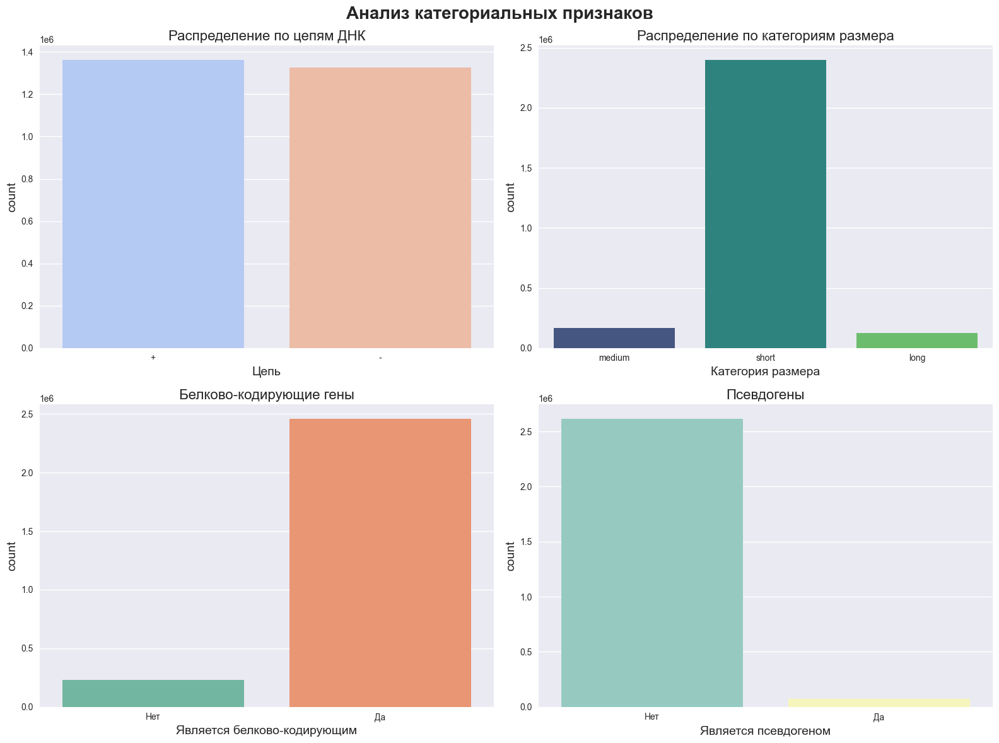

In [171]:
# Анализ категориальных признаков
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Анализ категориальных признаков', fontsize=20, fontweight='bold')

# Count plot для strand
sns.countplot(data=df, x='strand', ax=axes[0,0], palette='coolwarm')
axes[0,0].set_title('Распределение по цепям ДНК')
axes[0,0].set_xlabel('Цепь')

# Count plot для size_category
sns.countplot(data=df, x='size_category', ax=axes[0,1], palette='viridis')
axes[0,1].set_title('Распределение по категориям размера')
axes[0,1].set_xlabel('Категория размера')

# Count plot для is_protein_coding
sns.countplot(data=df, x='is_protein_coding', ax=axes[1,0], palette='Set2')
axes[1,0].set_title('Белково-кодирующие гены')
axes[1,0].set_xlabel('Является белково-кодирующим')
axes[1,0].set_xticklabels(['Нет', 'Да'])

# Count plot для is_pseudogene
sns.countplot(data=df, x='is_pseudogene', ax=axes[1,1], palette='Set3')
axes[1,1].set_title('Псевдогены')
axes[1,1].set_xlabel('Является псевдогеном')
axes[1,1].set_xticklabels(['Нет', 'Да'])

plt.tight_layout()
plt.show()

### **9. Гистограмма распределений**

In [174]:
# Сравнение распределений (Plotly)
fig = px.histogram(df[df['gene_length'] < 20000],  # ограничиваем для лучшей визуализации
                   x='gene_length',
                   color='strand',
                   marginal='box',
                   nbins=50,
                   title='Распределение длины генов по цепям ДНК',
                   labels={'gene_length': 'Длина гена'},
                   opacity=0.7,
                   barmode='overlay')
fig.update_layout(showlegend=True)
fig.show()

### **10. Pairplot**

/Users/wyrtnh.w/miniconda3/envs/my_env/lib/python3.13/site-packages/seaborn/axisgrid.py:1513: UserWarning:

The palette list has more values (5) than needed (3), which may not be intended.

/Users/wyrtnh.w/miniconda3/envs/my_env/lib/python3.13/site-packages/seaborn/axisgrid.py:1513: UserWarning:

The palette list has more values (5) than needed (3), which may not be intended.

/Users/wyrtnh.w/miniconda3/envs/my_env/lib/python3.13/site-packages/seaborn/axisgrid.py:1513: UserWarning:

The palette list has more values (5) than needed (3), which may not be intended.

/Users/wyrtnh.w/miniconda3/envs/my_env/lib/python3.13/site-packages/seaborn/axisgrid.py:1615: UserWarning:

The palette list has more values (5) than needed (3), which may not be intended.

/Users/wyrtnh.w/miniconda3/envs/my_env/lib/python3.13/site-packages/seaborn/axisgrid.py:1615: UserWarning:

The palette list has more values (5) than needed (3), which may not be intended.

/Users/wyrtnh.w/miniconda3/envs/my_env/lib/python3

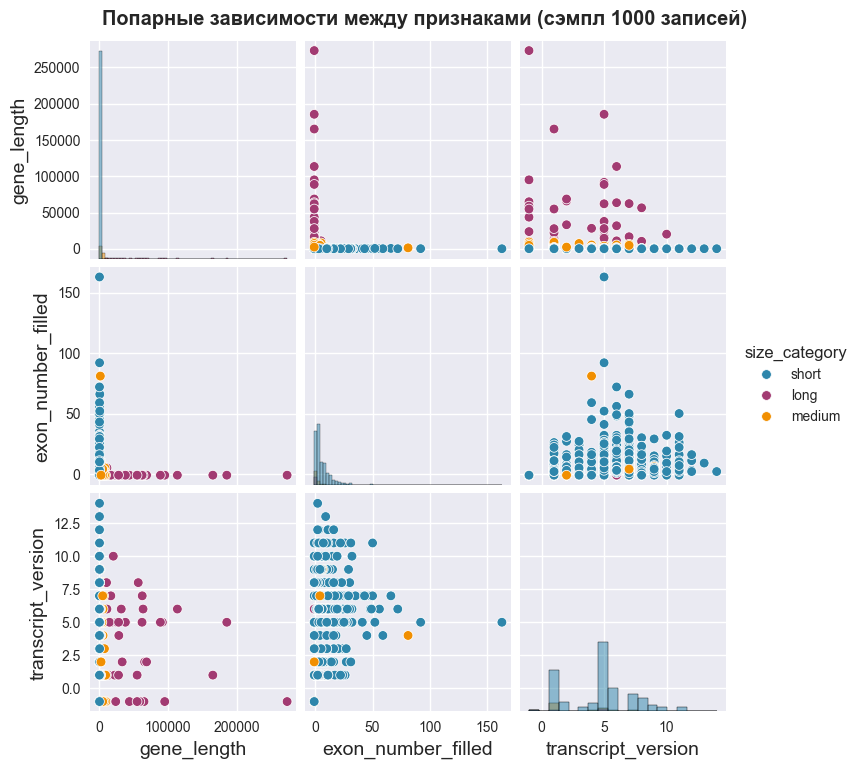

In [175]:
# Многомерный анализ (только для сэмпла из-за большого объема данных)
sample_df = df[['gene_length', 'exon_number_filled', 'transcript_version', 'size_category', 'strand']].sample(1000, random_state=42)
sns.pairplot(sample_df, hue='size_category', palette=custom_palette, diag_kind='hist')
plt.suptitle('Попарные зависимости между признаками (сэмпл 1000 записей)', y=1.02, fontweight='bold')
plt.show()